In [119]:
import numpy as np
import pandas as pd
import folium
from collections import Counter
import matplotlib.pyplot as plt
from folium import plugins
from folium.plugins import HeatMap
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from graphviz import Source
from sklearn import tree

In [30]:
data = pd.read_csv("../../../Police_Department_Incident_Reports__Historical_2003_to_May_2018.csv")
data.Date = pd.to_datetime(data.Date)
data['Hour'] = pd.to_datetime(data.Time).dt.hour
data['DayOfWeek'] = data.Date.dt.dayofweek
data['Month'] = data.Date.dt.month
data['Minutes'] = pd.to_datetime(data.Time).dt.minute
data['Year'] = pd.to_datetime(data.Time).dt.year
data['X'] = data['X'].astype(float)
data['Y'] = data['Y'].astype(float)

# Week 6

Phew. Is it week 6 already? This week, we've gotten to the machine-learning part. There are lots of course on machine learning at DTU. And across many research areas, people use ML for all kinds of things. So there's a good chance you're already familiar with what's going to happen today. 

So why are we doing a week devoted to machine learning? Well, there are two reasons
* Not all of you have done any machine learning, so this is a chance to make sure that everyone has had a chance to catch up.
* And the second reason that I'd to get across in the course (and IMHO it's an important one) is that visualization **AND** machine learning is a powerful combination. A combination that is pretty rare. 
  - Usually it's the case that people are either good at machine learning or data viz, but not both. 
  - So what we will be able to do in this class is an unusual combo: We can use ML to understand data and then visualize the outputs of the machine-learning.

To get started on all this, the idea for today is to give you a quick sense of machine-learning, the theory behind it and then get you guys ready to use the state-of-the-art machine learning framework for python, scikit-learn (`sklearn`).

Thus, the elements are as follows.

* Lightning intro to machine learning.
* Playing around with `sklearn` through a couple of tutorials.
* Then learning about the K nearest neighbors (KNN) algorithms, including an exercise based on the SF data.
* And finally, learning about decisions trees and trying them out on real-world crime data.

## Part 1: Lightning intro to machine learning

As mentioned above, we won't go too deep with machine learning in this class. Here there goal is to learn enough to combine data analysis with simple machine learning to create the next-level visualizations I advertised above.

So we kick off the machine-learning part by watching some video lectures on the *fundamentals of Machine learning*. The lectures have been prepared by our very own expert, Ole Winter, whose work focuses on Machine Learning. The lectures + slides have been prepared especially for you guys by Ole, and lovingly edited by yours truly.

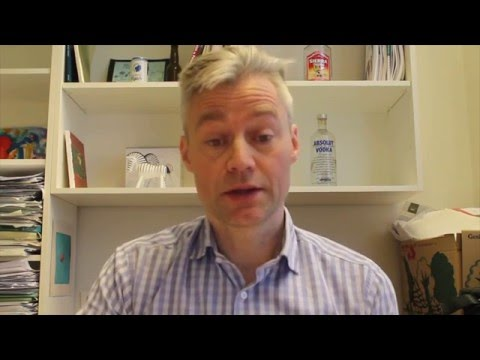

In [3]:
# Ole Winter, "What is Machine Learning" 
from IPython.display import YouTubeVideo
YouTubeVideo("SsCYF9tDY9Y",width=800, height=450)

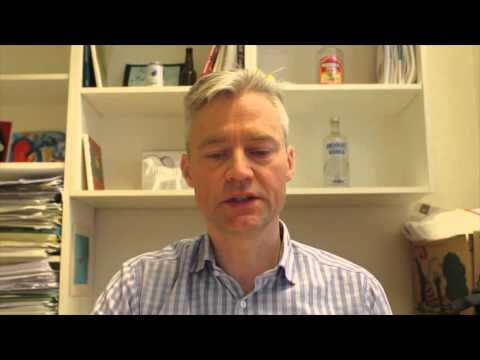

In [4]:
# Ole on Model Selection
YouTubeVideo("MHhlAtw3Ces",width=800, height=450)

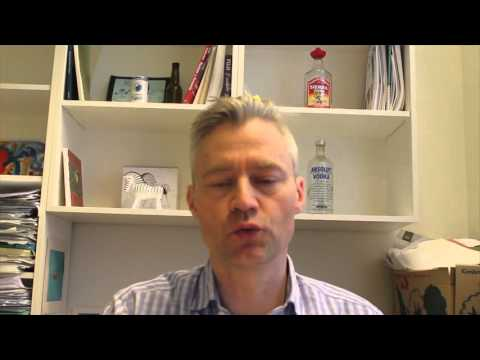

In [5]:
# Ole on feature extraction and selection
YouTubeVideo("RZmitKn220Q",width=800, height=450)

Now it's time to read a little bit about machine learning. For this written intro, we're going to use a book that I've used in this class in previous years. That book has a little bit of a special style. It focuses on learning everything from scratch ... and that includes defining mathematical concepts in code (rather than equations). It might take a little tiny bit of time to get used to. 

But it's a great book and a nice + concise intro that matches Ole's lectures pretty well. So here goes.

*Reading*: Data Science From Scratch (DSFS), Chapter 11. Get it [here](https://cn.inside.dtu.dk/cnnet/filesharing/download/5d0bbcac-3370-4ddf-a8bc-4a62ef931c45).

> *Exercises*: A few questions about machine learning.

> * What do we mean by a 'feature' in a machine learning model?

A feature is an input to the model. It can be part of the datasets to start with, or it can be created based on already existing features (squaring features, or features cube..)

> * What is the main problem with overfitting?

Overfitting is when a model very well predicts the training data, but poorly generalizes to new data it has not been trained on. Usually too complex models overfit, meaning they have learned and predict very well the data they have been trained with but fail to predict accurately when presented new data. This often happens when the model has learned the noise in the data.

> * Explain the connection between the bias-variance trade-off and overfitting/underfitting.

High bias means that the model perfoms poorly on any training set, but will look similar for different training sets.
This usually means underfitting. High variance on the other hand means very accuarate model for one training set, but very different models from other traning sets. This is what we call overfitting.

> * The `Luke is for leukemia` on page 145 in the reading is a great example of why accuracy is not a good measure in very unbalanced problems. You know about the incidents dataset we've been working with. Try to come up with a similar example based on the data we've been working with today.

## Part 2: Scikit-learn

In this section we introduce scikit-learn, `sklearn`. The best way to learn about any Python package, is to find a good tutorial and run through it to get an intuition for the syntax and how it's usage is intended (we've already done this with `pandas`, remember). 

The amazing package `sklearn` is state-of-the-art machine learning for Python. It's used in companies big and small all over the world and in lots of academic papers. To day we'll run through a couple of tutorials just to get you started.

We start with a high level overview presented in [this tutorial](https://scikit-learn.org/stable/tutorial/basic/tutorial.html). Read/work througH the first three sections (*Machine learning: the problem setting*, *Loading an example dataset*, *Learning and predicting*) to get a sense of data types and syntax.

> *Exercise*: Did you read the text?
>
> * Describe in your own words how data is organized in `sklearn` (how does a *dataset* work according to the tutorial)?
> * What is the dimensionality of the `.data` part of a dataset and what is the size of each dimension?


A dataset is contains `.data` and `.target`. `.data` has is a matrix of size $sample$ x $features$ and contains one sample per row and one feature per column. `.target` contains the labeling of each sample, hence their target value, used to either fit the model or evaluate it. `.target` is an array of length $samples$ 

Now we're going to work through a [tutorial on text analytics](https://scikit-learn.org/stable/tutorial/text_analytics/working_with_text_data.html). You might wonder, why text. Well, there are two reasons. Firstly, this is a great tutorial that introduces various concepts that are useful for you guys to know about, so even if text isn't really part of the course - the tutorial still sets you up to be excellent users of `sklearn`. Secondly, it's not a bad thing to know about text analysis. Even in this class. This could be something you might like to use in the final project. And now you have a great place to go if you want to dig into some textual data.

We won't do the whole tutorial. I'd like you to work thorough up to and including the section *Building a pipeline*.

> *Exercise*: Did you do the work?
>
> * Describe in your own words the dataset used in the tutorial.

The dataset is called Newsgroups. It contains around 20000 newsgroups documents and evenly distributed among 20 different newsgroups.

> * Investigate further: what kind of folder/file structure does the `sklearn.datasets.load_files` function expect?

It expects a two level folder structure. A main folder containing subfolders named after each category. Each folder should contains text files which will be labelled after the category used as folder's name.

> * What is the "bag-of-words" representation of text? How does this strategy turn text into data of the kind described above?

The bag-of-words starts with a dictionary containing every unique word found in the document(s) and assigning an integer ($j$) to each word. A matrix is then constructed in the following way: each row in the matrix will correspond to a document $i$ and there will be a column for each word in the dictionary. At the cell `[i, j]` will be assigned the count of how many occurrences of the word with index $j$ (in the dictionary) there are in document $i$

> * (Don't worry too much about tokenization and TF-IDF for now, but do check out those part if you want to use real text analysis later)

> * Once you've built the classifier, play around with it a bit. Describe the content of the `predicted` variable.

This variable contains the predicted categories for the input provided to the predict function. We have provided 2 texts and 2 categories have been returned in the form of an array of two elements. The two numbers correspond to the the category at that index in the twenty_train.target_names array.

> * You can find an overview of all tutorials here https://scikit-learn.org/stable/tutorial/index.html.

In [6]:
categories = ['alt.atheism', 'soc.religion.christian','comp.graphics', 'sci.med']

In [7]:
from sklearn.datasets import fetch_20newsgroups
twenty_train = fetch_20newsgroups(subset='train',categories=categories, shuffle=True, random_state=42)

In [8]:
len(twenty_train.filenames)

2257

In [9]:
twenty_train.target_names

['alt.atheism', 'comp.graphics', 'sci.med', 'soc.religion.christian']

In [10]:
len(twenty_train.data)

2257

In [11]:
twenty_train.data[0]

'From: sd345@city.ac.uk (Michael Collier)\nSubject: Converting images to HP LaserJet III?\nNntp-Posting-Host: hampton\nOrganization: The City University\nLines: 14\n\nDoes anyone know of a good way (standard PC application/PD utility) to\nconvert tif/img/tga files into LaserJet III format.  We would also like to\ndo the same, converting to HPGL (HP plotter) files.\n\nPlease email any response.\n\nIs this the correct group?\n\nThanks in advance.  Michael.\n-- \nMichael Collier (Programmer)                 The Computer Unit,\nEmail: M.P.Collier@uk.ac.city                The City University,\nTel: 071 477-8000 x3769                      London,\nFax: 071 477-8565                            EC1V 0HB.\n'

In [12]:
twenty_train.target

array([1, 1, 3, ..., 2, 2, 2])

In [13]:
from sklearn.feature_extraction.text import CountVectorizer
count_vect = CountVectorizer()
X_train_counts = count_vect.fit_transform(twenty_train.data)
X_train_counts.shape

(2257, 35788)

In [14]:
count_vect.vocabulary_.get(u'print')

26038

In [15]:
from sklearn.feature_extraction.text import TfidfTransformer
tf_transformer = TfidfTransformer(use_idf=False).fit(X_train_counts)
X_train_tf = tf_transformer.transform(X_train_counts)
X_train_tf.shape

(2257, 35788)

In [16]:
tfidf_transformer = TfidfTransformer()
X_train_tfidf = tfidf_transformer.fit_transform(X_train_counts)
X_train_tfidf.shape

(2257, 35788)

In [17]:
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(X_train_tfidf, twenty_train.target)

In [18]:
docs_new = ['', 'OpenGL on the GPU is fast']
X_new_counts = count_vect.transform(docs_new)
X_new_tfidf = tfidf_transformer.transform(X_new_counts)

predicted = clf.predict(X_new_tfidf)

for doc, category in zip(docs_new, predicted):
    print('%r => %s' % (doc, twenty_train.target_names[category]))

'' => soc.religion.christian
'OpenGL on the GPU is fast' => comp.graphics


In [19]:
predicted

array([3, 1])

## Part 3: KNN

Now it's time to work with a real algorithm. We'll take the simplest machine learning scheme in the universe. Although it's simple, it is still often useful (as we shall see when we use it to analyze crime data). It's called *K nearest neighbors*.

We start by Ole introducing the idea.

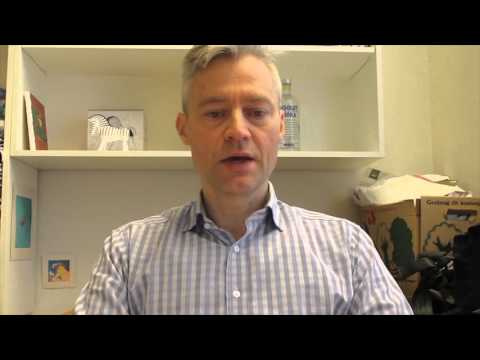

In [20]:
# Ole on K-nearest-neighbors
YouTubeVideo("OE159z8kC-Y",width=800, height=450)

Now, let's read about it. 

*Reading*: Again we turn to DSFS, this time chapter 12, as an intro to the KNN algorithm. Find it [here](https://cn.inside.dtu.dk/cnnet/filesharing/download/8923a9e2-ded5-4cd8-b334-42b9fc64d33a).

> *Warm up exercises*: K-nearest-neighbors
> 
> How does K-nearest-neighbors work? Explain in your own words.
Explain in your own words: What is the curse of dimensionality? Use figure 12-6 in DSFS as part of your explanation.

K-nearest-neighbors predicts the label/category of a new observation based on the ones from its k closest neighbors. Given a distance measure, it calculates the distance between the new point and all the known/labelled observations and selects the k closest ones. It then looks at the labels from these neighbors and either take the most common one, or wheights their contribution based on their distance to the new point (or other tecniques as well) and assigns the resulting label to the new point.

The more dimensions we have in our datasets, the more apart points will be. Each time we add a new dimension, we introduce a possibility for points to be distant in that dimension. As dimensions increase in number, so does the avarage distance from the closest distance between points, as it shows figure 12-6. This does not play well with KNN since more dimensions take points more apart and the risk of including not significant (the ones that contribute to the right labelling) neighbors in the closest ones increases.

Finally, we can start working with the crime data. Here's a little exercise


> *Exercise*: K-nearest-neighbors map.
>
> We know from last week's exercises that the focus crimes `PROSTITUTION`, `DRUG/NARCOTIC` and `DRIVING UNDER THE INFLUENCE` tend to be concentrated in certain neighborhoods, so we focus on those crime types since they will make the most sense a KNN - map.
> 
> * Begin by using `folium` (see Week4) to plot all incidents of the three crime types on their own map. This will give you an idea of how the varioius crimes are distributed across the city.
> * Next, it's time to set up your model based on the actual data. I recommend that you try out `sklearn`'s `KNeighborsClassifier`. For an intro, start with [this tutorial](https://scikit-learn.org/stable/tutorial/statistical_inference/supervised_learning.html) and follow the link to get a sense of the usage.

In [21]:
datacat = data[data.Category.isin(['PROSTITUTION', 'DRUG/NARCOTIC', 'DRIVING UNDER THE INFLUENCE'])]
datacat.head()

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location,PdId,Hour,Month,Minutes
11,60009826,DRUG/NARCOTIC,POSSESSION OF BASE/ROCK COCAINE FOR SALE,1,2006-01-03,16:24,MISSION,JUVENILE BOOKED,24TH ST / MISSION ST,-122.418448,37.752239,POINT (-122.418448186101 37.7522391652625),6000982616623,16,1,24
36,70203579,DRUG/NARCOTIC,POSSESSION OF MARIJUANA,6,2007-02-25,17:54,MISSION,NONE,0 Block of HOFF ST,-122.420436,37.764174,POINT (-122.420436287467 37.7641743318753),7020357916010,17,2,54
73,30710188,PROSTITUTION,SOLICITS FOR ACT OF PROSTITUTION,3,2003-06-12,13:00,SOUTHERN,"ARREST, BOOKED",1600 Block of FOLSOM ST,-122.415281,37.770232,POINT (-122.415280831397 37.7702324461737),3071018813060,13,6,0
76,80171568,DRUG/NARCOTIC,POSSESSION OF MARIJUANA,6,2008-02-17,18:35,TENDERLOIN,"ARREST, BOOKED",HYDE ST / GOLDEN GATE AV,-122.415508,37.781654,POINT (-122.415508242782 37.7816542806076),8017156816010,18,2,35
84,90920957,DRUG/NARCOTIC,POSSESSION OF NARCOTICS PARAPHERNALIA,0,2009-09-07,14:40,TENDERLOIN,"ARREST, BOOKED",TURK ST / JONES ST,-122.412414,37.783004,POINT (-122.412414263581 37.7830037964534),9092095716710,14,9,40


In [31]:
colors = {'PROSTITUTION': 'red', 'DRUG/NARCOTIC': 'blue', 'DRIVING UNDER THE INFLUENCE': 'green'}

map_knn = folium.Map(location=[37.773972, -122.431297], zoom_start = 13)
for index, row in data[data.Category == 'PROSTITUTION'].iterrows():
    folium.CircleMarker([row.Y, row.X],color=colors[row.Category], radius=2).add_to(map_knn)
map_knn

map_knn = folium.Map(location=[37.773972, -122.431297], zoom_start = 13)
for index, row in data[data.Category == 'DRUG/NARCOTIC'].iterrows():
    folium.CircleMarker([row.Y, row.X],color=colors[row.Category], radius=2).add_to(map_knn)
map_knn

map_knn = folium.Map(location=[37.773972, -122.431297], zoom_start = 13)
for index, row in data[data.Category == 'DRIVING UNDER THE INFLUENCE'].iterrows():
    folium.CircleMarker([row.Y, row.X],color=colors[row.Category], radius=2).add_to(map_knn)
map_knn

>   * You don't have to think a lot about testing/trainig and accuracy for this exercise. We're mostly interested in creating a map that's not too problematic. But do calculate the number of observations of each crime-type respectively. You'll find that the levels of each crime varies (lots of drug arrests, an intermediate amount of prostitiution registered, and very little drunk driving in the dataset). Since the algorithm classifies each point according to it's neighbors, *what could a consequence of this imbalance in the number of examples from each class mean for your map*?

Such an imbalance could lead to an over estimation of the most common class. Given the high presence of points from DRUG/NARCOTIC crime, the likelyhood for a new observation to have neighbors with DRUG/NARCOTIC is high. This will probably lead to the vast majority of new observations to be predicted as DRUG/NARCOTIC crimes as well.

>   * You can make the dataset 'balanced' by grabbing an equal number of examples from each crime category. 
>       * How do you expect that will change the KNN result? 
>       * In which situations is the balanced map useful - 
>       * When is the map where data is in proportion to occurrences useful?

The classification from KNN will also be more balanced
?
?

In [32]:
datacat.groupby(datacat.Category).count().IncidntNum

Category
DRIVING UNDER THE INFLUENCE      5672
DRUG/NARCOTIC                  119628
PROSTITUTION                    16701
Name: IncidntNum, dtype: int64

In [33]:
driving = datacat[datacat.Category == 'DRIVING UNDER THE INFLUENCE'].sample(n=5000)
prost = datacat[datacat.Category == 'PROSTITUTION'].sample(n=5000)
drug = datacat[datacat.Category == 'DRUG/NARCOTIC'].sample(n=5000)

balanceddata = pd.concat([driving, prost, drug])
balanceddata.groupby(datacat.Category).count().IncidntNum

Category
DRIVING UNDER THE INFLUENCE    5000
DRUG/NARCOTIC                  5000
PROSTITUTION                   5000
Name: IncidntNum, dtype: int64

>       * Choose which map you will work on in the following.
> * Now create an approximately square grid of point that runs over SF. You get to decide the grid-size, but I recommend somewhere between $50\times50$ and $100\times100$ points. I recommend using `folium` for this task.
> * Visualize your model by coloring the grid, coloring each grid point according to it's category. Create a plot of this kind for models where each point is colored according to the majority of its $5$, $10$, and $30$ nearest neighbors. Describe what happens to the map as you increase the number of neighbors, `K`. 
> * To see an example, [click here](https://raw.githubusercontent.com/suneman/socialdataanalysis2020/master/files/KNN-example.png). This one is a 100x100 grid based on crimes from 1st January 2017 until the end of 2018. And the categories are narcotics, prostitution and vehicle theft.

In [34]:
sf_lat1 = 37.805559
sf_lat2 = 37.643442
sf_long1 = -122.514398
sf_long2 = -122.364857

lats = np.linspace(sf_lat1, sf_lat2, 50)
longs = np.linspace(sf_long1, sf_long2, 50)

In [35]:
len(lats)

50

In [36]:
map_knn = folium.Map(location=[37.773972, -122.431297], zoom_start = 13)
for x in longs:
    for y in lats:
        folium.CircleMarker([y, x], radius=5).add_to(map_knn)
map_knn

In [37]:
datacatX = balanceddata[['X', 'Y']]
datacatY = balanceddata.Category.values

In [38]:
def mapwithneighbors(n):
    knnmodel = KNeighborsClassifier(n_neighbors=n)
    knnmodel.fit(datacatX, datacatY)
    gridpoints = [[x, y] for x in longs for y in lats]
    map_knn = folium.Map(location=[37.773972, -122.431297], zoom_start = 13)
    for x in longs:
        for y in lats:
            col = colors[knnmodel.predict([[x, y]])[0]]
            folium.CircleMarker([y, x],fill=True,fill_color=col, color=col,fill_opacity=1, radius=5).add_to(map_knn)
    return map_knn

In [39]:
mapwithneighbors(5)

In [40]:
mapwithneighbors(10)

In [41]:
mapwithneighbors(30)

## Part 4: Decision Trees

Now we turn to decision trees. This is a fantastically useful supervised machine-learning method, that we use all the time in research. To get started on the decision trees, we'll use some fantastic *visual* introduction. 


*Decision Trees Reading 1*: The visual introduction to decision trees on this webpage is AMAZING. Take a look to get an intuitive feel for how trees work. Do not miss this one, it's a treat! http://www.r2d3.us/visual-intro-to-machine-learning-part-1/

*Decision Trees Reading 2*: the second part of the visual introduction is about the topic of model selection, and bias/variance tradeoffs that we looked into earlier during this lesson. But once again, here those topics are visualized in a fantastic and inspiring way, that will make it stick in your brain better. So check it out http://www.r2d3.us/visual-intro-to-machine-learning-part-2/

*Decision Trees Reading 3*: Finally, you can also read about decision trees in DSFS, chapter 17. [Get it here](https://cn.inside.dtu.dk/cnnet/filesharing/download/6115e455-347f-4683-84a9-c6b6e2cb3802). 

And our little session on decision trees wouldn't be complete without hearing from Ole about these things. 

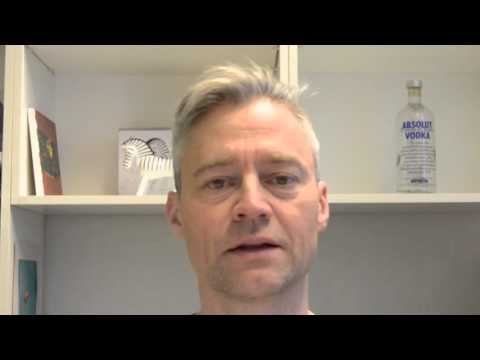

In [42]:
# Ole explains decision trees
YouTubeVideo("LAA_CnkAEx8",width=600, height=338)

> Exercises: Just a few questions to make sure you've read the text (DSFS chapter 17) and/or watched the video.
> 
> * There are two main kinds of decision trees depending on the type of output (numeric vs. categorical). What are they?
> * Explain in your own words: Why is entropy useful when deciding where to split the data?
> * Why are trees prone to overfitting?
> * Explain (in your own words) how random forests help prevent overfitting.


Decision trees outputting categorical values are called *categorical trees*, whereas the ones outputting numeircal values are called *regression trees*

Entropy is useful in evaluating whether a split will result in a useful divison of obeservations or not. Low entropy means that there are many observations of one category, which is desired when splitting, as this can lead the tree closer toa prediction or a leaf. Entropy is a measurment of how informative a split is.

Decision trees can continue adding splits in order to perfectly fit the training data. This leads to overfitting.

In random forest overfitting is prevented by fitting different trees with different features, different subsets of the data leading to trees with different splits. These trees then are all used to predict a new observations and used to vote on what value to predict for it. The trees somehow vote for the new observation and the majority is used as new label. In this way the one tree's overfitting is balanced and weakened by other trees which behave differently and possibly could even overfit, but differently because trained on other datasets.


> *Exercise*: Decision trees and real-world crime data
> 
> The idea for today is to pick two crime-types that have *different geographical patterns* and *different temporal patterns*. We can then use various variables of the real crime data as categories to build a decision tree. I'm thinking we can use
> * `DayOfWeek` (`Sunday`, ..., `Saturday`). (Note: Will need to be encodede as integer in `sklearn`)
> * `PD District` (`TENDERLOIN`, etc). (Note: Will need to be encodede as integer in `sklearn`)
> 
> And we can extract a few more from the `Time` and `Date` variables
> * Hour of the day (1-24)
> * Month of the year (1-12)
> 
> So your job is to **select two crime categories** that (based on your analyses from the past three weeks) have different spatio-temporal patterns. Then we are going to to build is a decision tree (or a random forest) that takes as input the four labels (Hour-of-the-day, Day-of-the-week, Month-of-the-year, and PD-District) of some crime (from one of the two categories) and then tries to predict which category that crime is from.
>
> Some notes/hints
> * It is a good idea to create a balanced dataset, that is, **grab an equal number of examples** from each of the two crime categories. Pick categories with lots of training data. It's probably nice to have something like 10000+ examples of each category to train on. 
> * Also, I recommend you grab your training data at `random` from the set of all examples, since we want crimes to be distributed equally over time.
> * A good option is the  `DecisionTreeClassifier`.
> * Since you have created a balanced dataset, the baseline performance (random guess) is 50%. How good can your classifier get?

In [83]:
data.PdDistrict = pd.Categorical(data['PdDistrict'])
dtsubset = data[['Hour', 'DayOfWeek', 'Month', 'Category']]
pddummies = pd.get_dummies(data['PdDistrict'], prefix = 'pddistrict')
dtsubset = pd.concat([dtsubset, pddummies], axis=1)

In [84]:
dtsubset.head()

,Hour,DayOfWeek,Month,Category,pddistrict_BAYVIEW,pddistrict_CENTRAL,pddistrict_INGLESIDE,pddistrict_MISSION,pddistrict_NORTHERN,pddistrict_PARK,pddistrict_RICHMOND,pddistrict_SOUTHERN,pddistrict_TARAVAL,pddistrict_TENDERLOIN
0,16,4,4,MISSING PERSON,0,0,0,0,0,0,0,0,1,0
1,12,3,3,WARRANTS,0,0,0,0,0,0,0,1,0,0
2,2,4,2,SECONDARY CODES,0,0,0,0,0,1,0,0,0,0
3,20,1,1,OTHER OFFENSES,0,0,0,1,0,0,0,0,0,0
4,18,5,5,SECONDARY CODES,0,0,0,1,0,0,0,0,0,0


Find categories with more than 10000 observations:

In [66]:
focuscategories = pd.Series(data.groupby(data.Category).count().IncidntNum).where(lambda x: x>15000).dropna().index.values
focuscategories

array(['ASSAULT', 'BURGLARY', 'DRUG/NARCOTIC', 'FORGERY/COUNTERFEITING',
       'FRAUD', 'LARCENY/THEFT', 'MISSING PERSON', 'NON-CRIMINAL',
       'OTHER OFFENSES', 'PROSTITUTION', 'ROBBERY', 'SECONDARY CODES',
       'SUSPICIOUS OCC', 'TRESPASS', 'VANDALISM', 'VEHICLE THEFT',
       'WARRANTS', 'WEAPON LAWS'], dtype=object)

In [114]:
crime1 = "BURGLARY"
crime2 = "PROSTITUTION"

In [115]:
crime1sample = dtsubset[dtsubset.Category == crime1].sample(n=15000)
crime2sample = dtsubset[dtsubset.Category == crime2].sample(n=15000)
dtcrimedata = pd.concat([crime1sample, crime2sample])
X = dtcrimedata.drop(['Category'], axis=1)
y = dtcrimedata.Category
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [116]:
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [117]:
y_predict = clf.predict(X_test)

In [120]:
f"{((y_predict == y_test).sum() / len(y_test) * 100)}%"

'78.77777777777779%'

In [122]:
from IPython.display import SVG
graph = Source(tree.export_graphviz(clf, out_file=None, feature_names=X.columns))
SVG(graph.pipe(format='svg'))

> There are also a couple of optional things to try if you're done with the exercise and have time to spend. 
> * Optional: Try out more variables like
>     * Year
>     * Something based on the Street-name.
>     * create a finer geo-grid based on GPS
>     * Etc
> * Optional: Do proper cross-validation for your algorithm
> * Optional: Include weather data

(Thanks to TA Germans for collaborating on the design of this exercise)